In [11]:
%reset


Once deleted, variables cannot be recovered. Proceed (y/[n])? y


In [13]:
import numpy as np
from parameters import *
import matplotlib.pyplot as plt
from sklearn import svm
import time
import pickle
import analysis_spatialcat
import importlib
%matplotlib inline

#data_dir = 'D:/Krithika/RNNs/wcscparameterscape_4000iters_bothtasks_largersquaretargetzones/'

data_dir = 'C:/Users/FREEDMAN_LAB/Documents/RNNs/intdmc_rnn-master/'
#fn = data_dir + 'DMC.pkl'
#fn = data_dir + 'DMC.pkl'
#fn_dmcnodelay = data_dir + 'DMC_NoDelay.pkl'
fn_oic = data_dir + 'intdmc_rnn-masterOIC.pkl'
fn_oicdmc=data_dir + 'OICDMC.pkl'
#fn_oicdelay=data_dir + 'OIC_Delay.pkl'

#results = pickle.load(open(fn,'rb'))
#results_dmcnodelay = pickle.load(open(fn_dmcnodelay,'rb'))
results_oic = pickle.load(open(fn_oic,'rb'))
results_oicdmc = pickle.load(open(fn_oicdmc,'rb'))
#results_oicdelay = pickle.load(open(fn_oicdelay,'rb'))


In [14]:
h_stacked_oic = np.stack(results_oic['h'], axis=1)
sample_dir_oic=results_oic['trial_info']['sample']

dmc_trials=np.where(results_oicdmc['trial_info']['task']==1)
sample_dir_dmcoic=results_oicdmc['trial_info']['sample'][dmc_trials]
h_stacked=np.stack(results_oicdmc['h'], axis=1)
h_dmcoic=h_stacked[:,:,np.squeeze(dmc_trials)]

int_trials=np.where(results_oicdmc['trial_info']['task']==0)
sample_dir_oicdmc=results_oicdmc['trial_info']['sample'][int_trials]
h_oicdmc=h_stacked[:,:,np.squeeze(int_trials)]



In [9]:
h_stacked_dmc = np.stack(results['h'], axis=1)
sample_dir_dmc=results['trial_info']['sample']

h_stacked_oic = np.stack(results_oic['h'], axis=1)
sample_dir_oic=results_oic['trial_info']['sample']

h_stacked_oicdelay = np.stack(results_oicdelay['h'], axis=1)
sample_dir_oicdelay=results_oicdelay['trial_info']['sample']

h_stacked_dmcnodelay = np.stack(results_dmcnodelay['h'], axis=1)
sample_dir_dmcnodelay=results_dmcnodelay['trial_info']['sample']

dmc_trials=np.where(results_oicdmc['trial_info']['task']==1)
sample_dir_dmcoic=results_oicdmc['trial_info']['sample'][dmc_trials]
h_stacked=np.stack(results_oicdmc['h'], axis=1)
h_dmcoic=h_stacked[:,:,np.squeeze(dmc_trials)]

int_trials=np.where(results_oicdmc['trial_info']['task']==0)
sample_dir_oicdmc=results_oicdmc['trial_info']['sample'][int_trials]
h_oicdmc=h_stacked[:,:,np.squeeze(int_trials)]

NameError: name 'results' is not defined

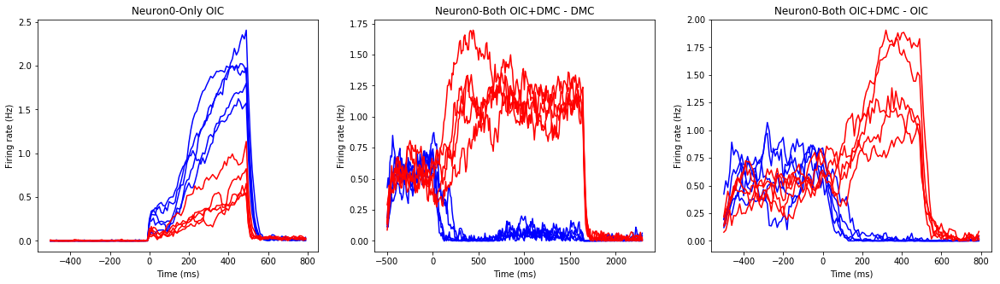

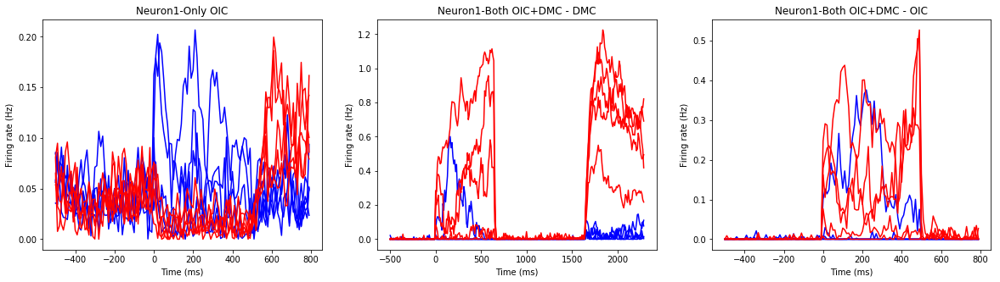

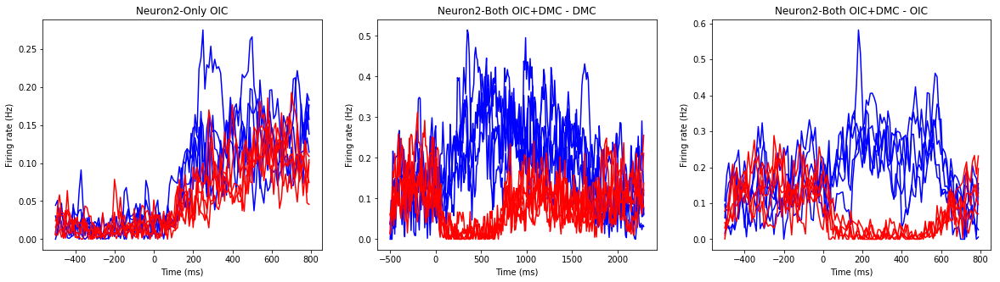

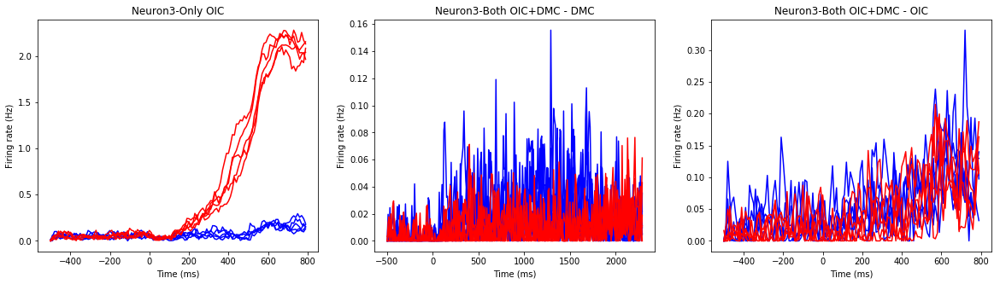

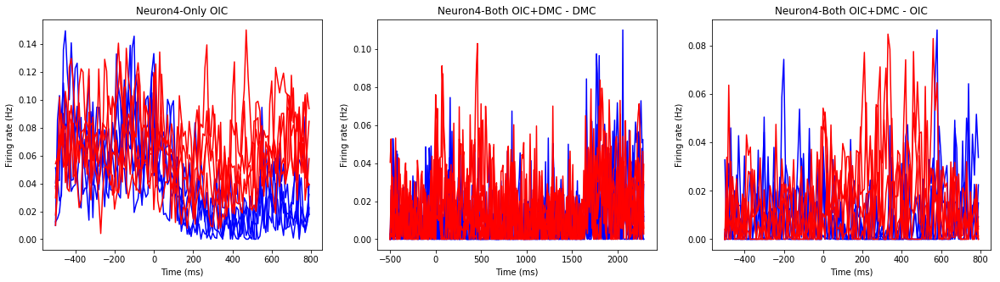

...

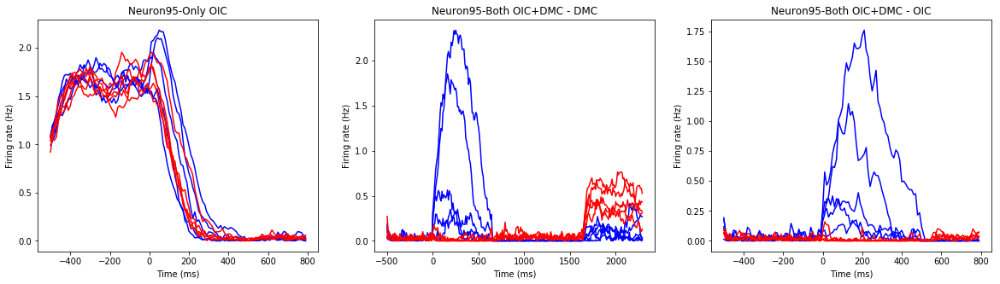

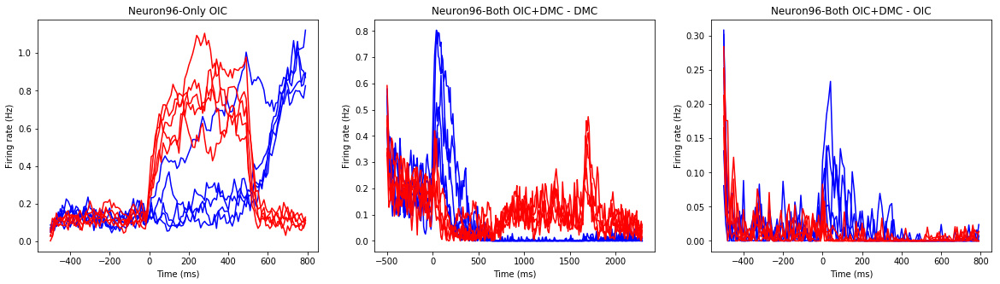

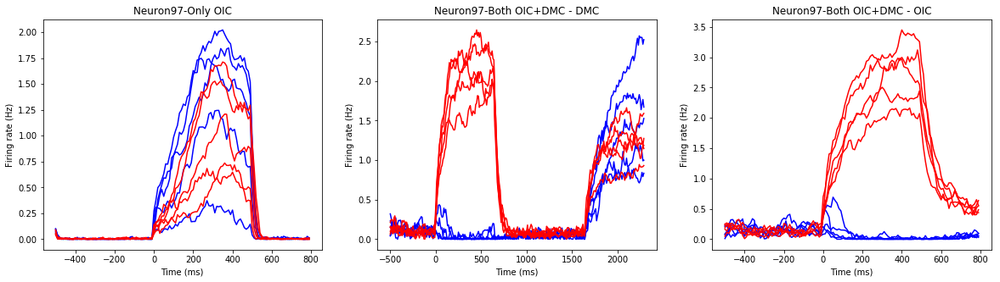

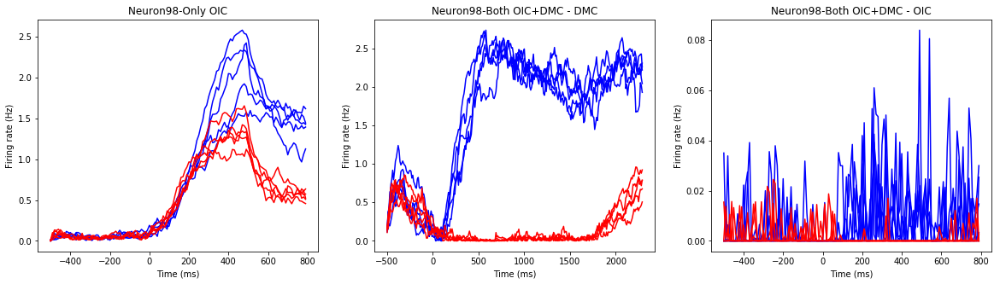

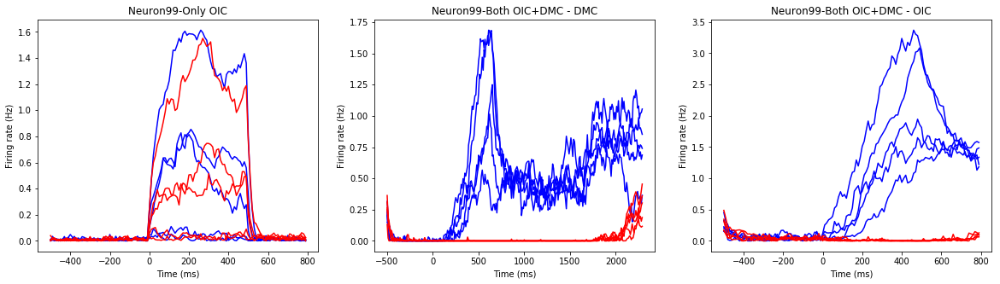

In [15]:
for n in range(0,np.shape(h_stacked_oic)[0]): 
    psth_dmc=[]
    psth_int=[]
    psth_dmcoic=[]
    psth_oicdmc=[]
    psth_oicdelay=[]
    psth_dmcnodelay=[]
    for dirn in range(0,10):
        
        dir_trials_dmcoic=np.where(sample_dir_dmcoic==dirn)
        psth_dmcoic.append(np.mean(h_dmcoic[n,:,dir_trials_dmcoic],axis=1))
        """
        
        
        dir_trials_dmc=np.where(sample_dir_dmc==dirn)
        psth_dmc.append(np.mean(h_stacked_dmc[n,:,dir_trials_dmc],axis=1))
        
        dir_trials_oicdelay=np.where(sample_dir_oicdelay==dirn)
        psth_oicdelay.append(np.mean(h_stacked_oicdelay[n,:,dir_trials_oicdelay],axis=1))
        
        dir_trials_dmcnodelay=np.where(sample_dir_dmcnodelay==dirn)
        psth_dmcnodelay.append(np.mean(h_stacked_dmcnodelay[n,:,dir_trials_dmcnodelay],axis=1))
        """
        dir_trials_oic=np.where(sample_dir_oic==dirn)
        psth_int.append(np.mean(h_stacked_oic[n,:,dir_trials_oic],axis=1))
        
        dir_trials_oicdmc=np.where(sample_dir_oicdmc==dirn)
        psth_oicdmc.append(np.mean(h_oicdmc[n,:,dir_trials_oicdmc],axis=1))

    plt.figure(figsize=(20,5))
        
    
    """
    plt.subplot(1, 4, 1)
    for ndir in range(0,10):
        if ndir<5:
            plt.plot(np.arange(-500,2150,10),np.squeeze(psth_dmc[ndir][0,25:290]),color='b')
        else:
            plt.plot(np.arange(-500,2150,10),np.squeeze(psth_dmc[ndir][0,25:290]),color='r')
    plt.xlabel('Time (ms)')
    plt.ylabel('Firing rate (Hz)')
    plt.title('Neuron'+str(n)+'-Only DMC')
    
    plt.subplot(1, 6, 2)
    for ndir in range(0,10):
        if ndir<5:
            plt.plot(np.arange(-500,1300,10),np.squeeze(psth_dmcnodelay[ndir][0,25:205]),color='b')
        else:
            plt.plot(np.arange(-500,1300,10),np.squeeze(psth_dmcnodelay[ndir][0,25:205]),color='r')
    plt.xlabel('Time (ms)')
    plt.ylabel('Firing rate (Hz)')
    plt.title('Neuron'+str(n)+'-Only DMC, No delay, M/NM')
    
    plt.subplot(1, 6, 3)
    for ndir in range(0,10):
        if ndir<5:
            plt.plot(np.arange(-500,1300,10),np.squeeze(psth_oicdelay[ndir][0,25:205]),color='b')
        else:
            plt.plot(np.arange(-500,1300,10),np.squeeze(psth_oicdelay[ndir][0,25:205]),color='r')
    plt.xlabel('Time (ms)')
    plt.ylabel('Firing rate (Hz)')
    plt.title('Neuron'+str(n)+'-Only OIC, delay, C1/C2')
    """
    plt.subplot(1, 3, 1)
    for ndir in range(0,10):
        if ndir<5:
            plt.plot(np.arange(-500,800,10),np.squeeze(psth_int[ndir][0,0:130]),color='b')
        else:
            plt.plot(np.arange(-500,800,10),np.squeeze(psth_int[ndir][0,0:130]),color='r')
    plt.xlabel('Time (ms)')
    plt.ylabel('Firing rate (Hz)')
    plt.title('Neuron'+str(n)+'-Only OIC')
    
    plt.subplot(1, 3, 2)
    for ndir in range(0,10):
        if ndir<5:
            plt.plot(np.arange(-500,2300,10),np.squeeze(psth_dmcoic[ndir][0,0:280]),color='b')
        else:
            plt.plot(np.arange(-500,2300,10),np.squeeze(psth_dmcoic[ndir][0,0:280]),color='r')
    plt.xlabel('Time (ms)')
    plt.ylabel('Firing rate (Hz)')
    plt.title('Neuron'+str(n)+'-Both OIC+DMC - DMC')
    
    plt.subplot(1, 3, 3)
    for ndir in range(0,10):
        if ndir<5:
            plt.plot(np.arange(-500,800,10),np.squeeze(psth_oicdmc[ndir][0,0:130]),color='b')
        else:
            plt.plot(np.arange(-500,800,10),np.squeeze(psth_oicdmc[ndir][0,0:130]),color='r')
    plt.xlabel('Time (ms)')
    plt.ylabel('Firing rate (Hz)')
    plt.title('Neuron'+str(n)+'-Both OIC+DMC - OIC')
    

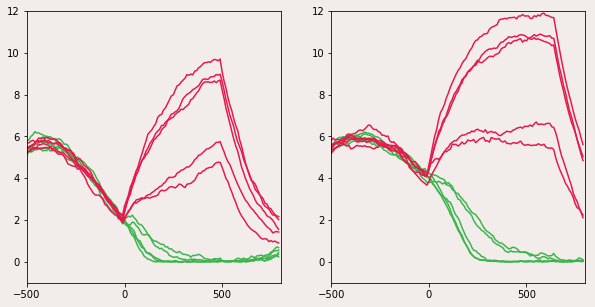

In [22]:
for n in range(97,98): 
    psth_dmc=[]
    psth_int=[]
    psth_dmcoic=[]
    psth_oicdmc=[]
    psth_oicdelay=[]
    psth_dmcnodelay=[]
    for dirn in range(0,10):
        dir_trials_dmcoic=np.where(sample_dir_dmcoic==dirn)
        psth_dmcoic.append(np.mean(h_dmcoic[n,:,dir_trials_dmcoic],axis=1))
        
        dir_trials_oicdmc=np.where(sample_dir_oicdmc==dirn)
        psth_oicdmc.append(np.mean(h_oicdmc[n,:,dir_trials_oicdmc],axis=1))
        
        dir_trials_dmc=np.where(sample_dir_dmc==dirn)
        psth_dmc.append(np.mean(h_stacked_dmc[n,:,dir_trials_dmc],axis=1))
        
        dir_trials_oicdelay=np.where(sample_dir_oicdelay==dirn)
        psth_oicdelay.append(np.mean(h_stacked_oicdelay[n,:,dir_trials_oicdelay],axis=1))
        
        dir_trials_dmcnodelay=np.where(sample_dir_dmcnodelay==dirn)
        psth_dmcnodelay.append(np.mean(h_stacked_dmcnodelay[n,:,dir_trials_dmcnodelay],axis=1))
        
        dir_trials_oic=np.where(sample_dir_oic==dirn)
        psth_int.append(np.mean(h_stacked_oic[n,:,dir_trials_oic],axis=1))


    #plt.figure(figsize=(10,5))
    fig = plt.figure(facecolor=(242/255, 237/255 ,235/255), figsize=(10,5))
    axes = fig.add_subplot(122)
    axes.patch.set_facecolor((242/255, 237/255 ,235/255))

    #plt.subplot(121)
    
    for ndir in range(0,10):
        if ndir<5:
            plt.plot(np.arange(-500,800,10),np.squeeze(psth_dmcoic[ndir][0,25:155]),color='#3cb44b')
        else:
            plt.plot(np.arange(-500,800,10),np.squeeze(psth_dmcoic[ndir][0,25:155]),color='#e6194b')
    #plt.xlabel('Time (ms)')
    #plt.ylabel('Firing rate (Hz)')
    #plt.title('Neuron'+str(n)+'-Both OIC+DMC - DMC')
    plt.ylim([-1, 12])   
    plt.xticks([-500, 0,500])   
    plt.xlim([-500,800])
    
    
    #plt.subplot(122)
    axes2 = fig.add_subplot(121)
    axes2.patch.set_facecolor((242/255, 237/255 ,235/255))    

    for ndir in range(0,10):
        if ndir<5:
            plt.plot(np.arange(-500,800,10),np.squeeze(psth_oicdmc[ndir][0,25:155]),color='#3cb44b')
        else:
            plt.plot(np.arange(-500,800,10),np.squeeze(psth_oicdmc[ndir][0,25:155]),color='#e6194b')
    #plt.xlabel('Time (ms)')
    #plt.ylabel('Firing rate (Hz)')
    #plt.title('Neuron'+str(n)+'-Both OIC+DMC - OIC')
    plt.xlim([-500,800])
    plt.ylim([-1, 12])   
    plt.xticks([-500, 0,500])
   
    
savename = 'example_neurons.eps'
fig.savefig(savename, bbox_inches='tight', transparent=True)    

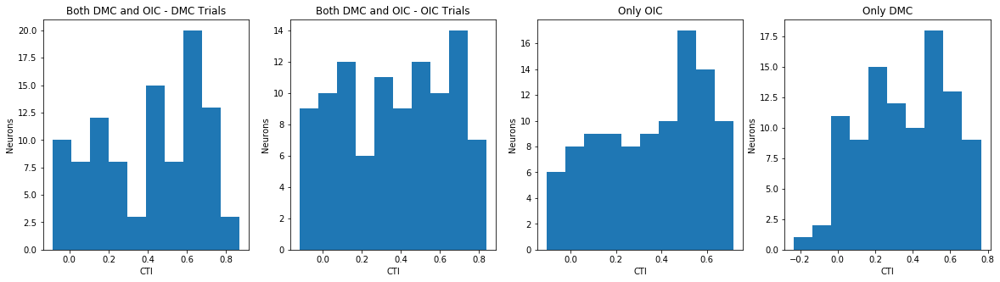

In [536]:
from sklearn.metrics import roc_auc_score
import itertools
wcd_ind=[]
wcd_ind.append([0 ,1])
wcd_ind.append([0 ,2])
wcd_ind.append([0 ,4])
wcd_ind.append([1 ,2])
wcd_ind.append([2 ,3])
wcd_ind.append([3 ,4])
wcd_ind.append([5 ,6])
wcd_ind.append([5 ,7])
wcd_ind.append([6 ,8])
wcd_ind.append([6 ,7])
wcd_ind.append([7 ,9])
wcd_ind.append([8 ,7])

bcd_ind=[]
bcd_ind.append([1 ,5])
bcd_ind.append([2 ,5])
bcd_ind.append([4 ,5])
bcd_ind.append([0 ,6])
bcd_ind.append([2 ,6])
bcd_ind.append([0 ,7])
bcd_ind.append([1 ,7])
bcd_ind.append([3 ,7])
bcd_ind.append([0 ,8])
bcd_ind.append([3 ,8])
bcd_ind.append([2 ,9])
bcd_ind.append([4 ,9])


cti_dmcoic=[]
cti_oicdmc=[]
cti_dmc=[]
cti_int=[]
for n in range(0,np.shape(h_stacked)[0]): 
    psth_dmc=[]
    psth_int=[]
    psth_dmcoic=[]
    psth_oicdmc=[]
    psth_oicdelay=[]
    psth_dmcnodelay=[]
    bcd_dmc=[]
    wcd_dmc=[]
    bcd_int=[]
    wcd_int=[]
    bcd_oicdmc=[]
    wcd_oicdmc=[]
    bcd_dmcoic=[]
    wcd_dmcoic=[]
    for dirn in range(0,10):
        dir_trials_dmcoic=np.where(sample_dir_dmcoic==dirn)
        psth_dmcoic.append(h_dmcoic[n,:,dir_trials_dmcoic])
        
        dir_trials_oicdmc=np.where(sample_dir_oicdmc==dirn)
        psth_oicdmc.append(h_oicdmc[n,:,dir_trials_oicdmc])
        
        dir_trials_dmc=np.where(sample_dir_dmc==dirn)
        psth_dmc.append(h_stacked_dmc[n,:,dir_trials_dmc])
        
        dir_trials_oic=np.where(sample_dir_oic==dirn)
        psth_int.append(h_stacked_oic[n,:,dir_trials_oic])
        
    for i in range(0,11):
        wcd_dmcoic.append(np.mean(psth_dmcoic[wcd_ind[i][0]][:,:,81:126])-np.mean(psth_dmcoic[wcd_ind[i][1]][:,:,81:126]))
        bcd_dmcoic.append(np.mean(psth_dmcoic[bcd_ind[i][0]][:,:,81:126])-np.mean(psth_dmcoic[bcd_ind[i][1]][:,:,81:126]))
        
        wcd_oicdmc.append(np.mean(psth_oicdmc[wcd_ind[i][0]][:,:,81:126])-np.mean(psth_oicdmc[wcd_ind[i][1]][:,:,81:126]))
        bcd_oicdmc.append(np.mean(psth_oicdmc[bcd_ind[i][0]][:,:,81:126])-np.mean(psth_oicdmc[bcd_ind[i][1]][:,:,81:126]))
        
        wcd_dmc.append(np.mean(psth_dmc[wcd_ind[i][0]][:,:,81:126])-np.mean(psth_dmc[wcd_ind[i][1]][:,:,81:126]))
        bcd_dmc.append(np.mean(psth_dmc[bcd_ind[i][0]][:,:,81:126])-np.mean(psth_dmc[bcd_ind[i][1]][:,:,81:126]))
        
        wcd_int.append(np.mean(psth_int[wcd_ind[i][0]][:,:,81:126])-np.mean(psth_int[wcd_ind[i][1]][:,:,81:126]))
        bcd_int.append(np.mean(psth_int[bcd_ind[i][0]][:,:,81:126])-np.mean(psth_int[bcd_ind[i][1]][:,:,81:126]))
        
    cti_dmcoic.append((np.mean(np.abs(bcd_dmcoic))-np.mean(np.abs(wcd_dmcoic)))/(np.mean(np.abs(bcd_dmcoic))+np.mean(np.abs(wcd_dmcoic))))
    cti_oicdmc.append((np.mean(np.abs(bcd_oicdmc))-np.mean(np.abs(wcd_oicdmc)))/(np.mean(np.abs(bcd_oicdmc))+np.mean(np.abs(wcd_oicdmc))))
    cti_dmc.append((np.mean(np.abs(bcd_dmc))-np.mean(np.abs(wcd_dmc)))/(np.mean(np.abs(bcd_dmc))+np.mean(np.abs(wcd_dmc))))
    cti_int.append((np.mean(np.abs(bcd_int))-np.mean(np.abs(wcd_int)))/(np.mean(np.abs(bcd_int))+np.mean(np.abs(wcd_int))))
        
plt.figure(figsize=(20,5))
plt.subplot(1, 4, 1)
plt.hist(cti_dmcoic)
plt.xlabel('CTI')
plt.ylabel('Neurons')
plt.title('Both DMC and OIC - DMC Trials')        

plt.subplot(1, 4, 2)
plt.hist(cti_oicdmc)
plt.xlabel('CTI')
plt.ylabel('Neurons')
plt.title('Both DMC and OIC - OIC Trials')    

plt.subplot(1, 4, 3)
plt.hist(cti_int)
plt.xlabel('CTI')
plt.ylabel('Neurons')
plt.title('Only OIC')      

plt.subplot(1, 4, 4)
plt.hist(cti_dmc)
plt.xlabel('CTI')
plt.ylabel('Neurons')
plt.title('Only DMC')     

In [548]:
from sklearn.metrics import roc_auc_score
import itertools
wcd_ind=[]
wcd_ind.append([0 ,1])
wcd_ind.append([0 ,2])
wcd_ind.append([0 ,4])
wcd_ind.append([1 ,2])
wcd_ind.append([2 ,3])
wcd_ind.append([3 ,4])
wcd_ind.append([5 ,6])
wcd_ind.append([5 ,7])
wcd_ind.append([6 ,8])
wcd_ind.append([6 ,7])
wcd_ind.append([7 ,9])
wcd_ind.append([8 ,7])

bcd_ind=[]
bcd_ind.append([1 ,5])
bcd_ind.append([2 ,5])
bcd_ind.append([4 ,5])
bcd_ind.append([0 ,6])
bcd_ind.append([2 ,6])
bcd_ind.append([0 ,7])
bcd_ind.append([1 ,7])
bcd_ind.append([3 ,7])
bcd_ind.append([0 ,8])
bcd_ind.append([3 ,8])
bcd_ind.append([2 ,9])
bcd_ind.append([4 ,9])


cti_dmcoic=[]
cti_oicdmc=[]
cti_dmc=[]
cti_int=[]

normbcd_dmcoic=[]
normbcd_oicdmc=[]
normbcd_dmc=[]
normbcd_int=[]

normwcd_dmcoic=[]
normwcd_oicdmc=[]
normwcd_dmc=[]
normwcd_int=[]

for n in range(0,np.shape(h_stacked)[0]): 
    psth_dmc=[]
    psth_int=[]
    psth_dmcoic=[]
    psth_oicdmc=[]
    psth_oicdelay=[]
    psth_dmcnodelay=[]
    
    cti_dmcoic_t=[]
    cti_oicdmc_t=[]
    cti_dmc_t=[]
    cti_int_t=[]
    
    normbcd_dmcoic_t=[]
    normbcd_oicdmc_t=[]
    normbcd_dmc_t=[]
    normbcd_int_t=[]
    
    normwcd_dmcoic_t=[]
    normwcd_oicdmc_t=[]
    normwcd_dmc_t=[]
    normwcd_int_t=[]
    
    
    for dirn in range(0,10):
        dir_trials_dmcoic=np.where(sample_dir_dmcoic==dirn)
        psth_dmcoic.append(h_dmcoic[n,:,dir_trials_dmcoic])
        
        dir_trials_oicdmc=np.where(sample_dir_oicdmc==dirn)
        psth_oicdmc.append(h_oicdmc[n,:,dir_trials_oicdmc])
        
        dir_trials_dmc=np.where(sample_dir_dmc==dirn)
        psth_dmc.append(h_stacked_dmc[n,:,dir_trials_dmc])
        
        dir_trials_oic=np.where(sample_dir_oic==dirn)
        psth_int.append(h_stacked_oic[n,:,dir_trials_oic])
    
    for t in range(26,126):
        bcd_dmc=[]
        wcd_dmc=[]
        bcd_int=[]
        wcd_int=[]
        bcd_oicdmc=[]
        wcd_oicdmc=[]
        bcd_dmcoic=[]
        wcd_dmcoic=[]
        
        for i in range(0,11):
            wcd_dmcoic.append(np.mean(psth_dmcoic[wcd_ind[i][0]][:,:,t])-np.mean(psth_dmcoic[wcd_ind[i][1]][:,:,t]))
            bcd_dmcoic.append(np.mean(psth_dmcoic[bcd_ind[i][0]][:,:,t])-np.mean(psth_dmcoic[bcd_ind[i][1]][:,:,t]))

            wcd_oicdmc.append(np.mean(psth_oicdmc[wcd_ind[i][0]][:,:,t])-np.mean(psth_oicdmc[wcd_ind[i][1]][:,:,t]))
            bcd_oicdmc.append(np.mean(psth_oicdmc[bcd_ind[i][0]][:,:,t])-np.mean(psth_oicdmc[bcd_ind[i][1]][:,:,t]))

            wcd_dmc.append(np.mean(psth_dmc[wcd_ind[i][0]][:,:,t])-np.mean(psth_dmc[wcd_ind[i][1]][:,:,t]))
            bcd_dmc.append(np.mean(psth_dmc[bcd_ind[i][0]][:,:,t])-np.mean(psth_dmc[bcd_ind[i][1]][:,:,t]))

            wcd_int.append(np.mean(psth_int[wcd_ind[i][0]][:,:,t])-np.mean(psth_int[wcd_ind[i][1]][:,:,t]))
            bcd_int.append(np.mean(psth_int[bcd_ind[i][0]][:,:,t])-np.mean(psth_int[bcd_ind[i][1]][:,:,t]))

        cti_dmcoic_t.append((np.mean(np.abs(bcd_dmcoic))-np.mean(np.abs(wcd_dmcoic)))/(np.mean(np.abs(bcd_dmcoic))+np.mean(np.abs(wcd_dmcoic))))
        cti_oicdmc_t.append((np.mean(np.abs(bcd_oicdmc))-np.mean(np.abs(wcd_oicdmc)))/(np.mean(np.abs(bcd_oicdmc))+np.mean(np.abs(wcd_oicdmc))))
        cti_dmc_t.append((np.mean(np.abs(bcd_dmc))-np.mean(np.abs(wcd_dmc)))/(np.mean(np.abs(bcd_dmc))+np.mean(np.abs(wcd_dmc))))
        cti_int_t.append((np.mean(np.abs(bcd_int))-np.mean(np.abs(wcd_int)))/(np.mean(np.abs(bcd_int))+np.mean(np.abs(wcd_int))))
        
        normbcd_dmcoic_t.append((np.mean(np.abs(bcd_dmcoic)))/(np.mean(np.abs(bcd_dmcoic))+np.mean(np.abs(wcd_dmcoic))))
        normbcd_oicdmc_t.append((np.mean(np.abs(bcd_oicdmc)))/(np.mean(np.abs(bcd_oicdmc))+np.mean(np.abs(wcd_oicdmc))))
        normbcd_dmc_t.append((np.mean(np.abs(bcd_dmc)))/(np.mean(np.abs(bcd_dmc))+np.mean(np.abs(wcd_dmc))))
        normbcd_int_t.append((np.mean(np.abs(bcd_int)))/(np.mean(np.abs(bcd_int))+np.mean(np.abs(wcd_int))))
        
        normwcd_dmcoic_t.append((np.mean(np.abs(wcd_dmcoic)))/(np.mean(np.abs(bcd_dmcoic))+np.mean(np.abs(wcd_dmcoic))))
        normwcd_oicdmc_t.append((np.mean(np.abs(wcd_oicdmc)))/(np.mean(np.abs(bcd_oicdmc))+np.mean(np.abs(wcd_oicdmc))))
        normwcd_dmc_t.append((np.mean(np.abs(wcd_dmc)))/(np.mean(np.abs(bcd_dmc))+np.mean(np.abs(wcd_dmc))))
        normwcd_int_t.append((np.mean(np.abs(wcd_int)))/(np.mean(np.abs(bcd_int))+np.mean(np.abs(wcd_int))))
        
    cti_dmcoic.append(cti_dmcoic_t)
    cti_oicdmc.append(cti_oicdmc_t)
    cti_dmc.append(cti_dmc_t)
    cti_int.append(cti_int_t)
    
    normbcd_dmcoic.append(normbcd_dmcoic_t)
    normbcd_oicdmc.append(normbcd_oicdmc_t)
    normbcd_dmc.append(normbcd_dmc_t)
    normbcd_int.append(normbcd_int_t)
    
    normwcd_dmcoic.append(normwcd_dmcoic_t)
    normwcd_oicdmc.append(normwcd_oicdmc_t)
    normwcd_dmc.append(normwcd_dmc_t)
    normwcd_int.append(normwcd_int_t)
    
    

C:\Users\Krithika\Anaconda3\lib\site-packages\ipykernel_launcher.py:108: RuntimeWarning: invalid value encountered in float_scalars
C:\Users\Krithika\Anaconda3\lib\site-packages\ipykernel_launcher.py:113: RuntimeWarning: invalid value encountered in float_scalars
C:\Users\Krithika\Anaconda3\lib\site-packages\ipykernel_launcher.py:118: RuntimeWarning: invalid value encountered in float_scalars
C:\Users\Krithika\Anaconda3\lib\site-packages\ipykernel_launcher.py:107: RuntimeWarning: invalid value encountered in float_scalars
C:\Users\Krithika\Anaconda3\lib\site-packages\ipykernel_launcher.py:112: RuntimeWarning: invalid value encountered in float_scalars
C:\Users\Krithika\Anaconda3\lib\site-packages\ipykernel_launcher.py:117: RuntimeWarning: invalid value encountered in float_scalars
C:\Users\Krithika\Anaconda3\lib\site-packages\ipykernel_launcher.py:109: RuntimeWarning: invalid value encountered in float_scalars
C:\Users\Krithika\Anaconda3\lib\site-packages\ipykernel_launcher.py:114: Run

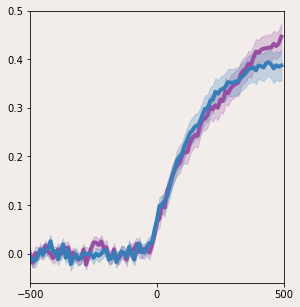

In [557]:
#plt.figure(figsize=(10,5))
fig = plt.figure(facecolor=(242/255, 237/255 ,235/255), figsize=(10,5))
axes = fig.add_subplot(122)
axes.patch.set_facecolor((242/255, 237/255 ,235/255))

plt.plot(np.arange(-500,500,10),np.nanmean(cti_dmcoic,axis=0).T,color='#984ea3',linewidth=4)
plt.fill_between(np.arange(-500,500,10),np.nanmean(cti_dmcoic,axis=0).T+np.nanstd(cti_dmcoic,0).T/np.sqrt(100), np.nanmean(cti_dmcoic,axis=0).T-np.nanstd(cti_dmcoic,0).T/np.sqrt(100), alpha=0.25,color='#984ea3')

plt.plot(np.arange(-500,500,10),np.nanmean(cti_oicdmc,axis=0).T,color='#377eb8',linewidth=4)
plt.fill_between(np.arange(-500,500,10),np.nanmean(cti_oicdmc,axis=0).T+np.nanstd(cti_oicdmc,0).T/np.sqrt(100), np.nanmean(cti_oicdmc,axis=0).T-np.nanstd(cti_oicdmc,0).T/np.sqrt(100), alpha=0.25,color='#377eb8')

plt.xticks([-500, 0,500])   
plt.xlim([-500,500])
savename = 'CTI.png'
fig.savefig(savename, bbox_inches='tight', transparent=True)        

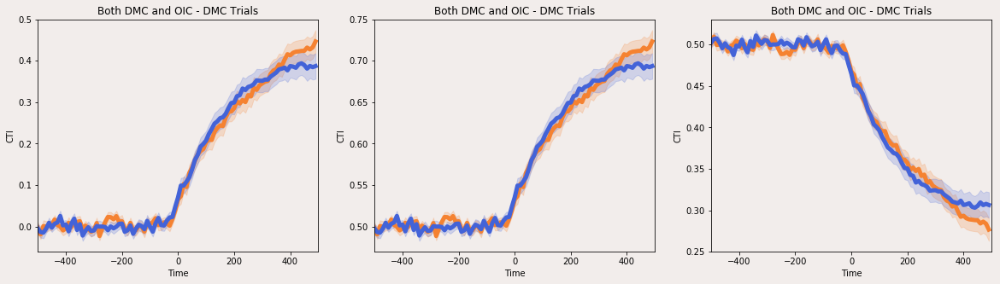

In [480]:

fig = plt.figure(facecolor=(242/255, 237/255 ,235/255), figsize=(20,5))
axes = fig.add_subplot(131)
axes.patch.set_facecolor((242/255, 237/255 ,235/255))
#plt.subplot(1, 3, 1)
plt.plot(np.arange(-500,500,10),np.nanmean(cti_dmcoic,axis=0).T,color='#f58231',linewidth=5)
plt.fill_between(np.arange(-500,500,10),np.nanmean(cti_dmcoic,axis=0).T+np.nanstd(cti_dmcoic,0).T/np.sqrt(100), np.nanmean(cti_dmcoic,axis=0).T-np.nanstd(cti_dmcoic,0).T/np.sqrt(100), alpha=0.2,color='#f58231')

plt.plot(np.arange(-500,500,10),np.nanmean(cti_oicdmc,axis=0).T,color='#4363d8',linewidth=5)
plt.fill_between(np.arange(-500,500,10),np.nanmean(cti_oicdmc,axis=0).T+np.nanstd(cti_oicdmc,0).T/np.sqrt(100), np.nanmean(cti_oicdmc,axis=0).T-np.nanstd(cti_oicdmc,0).T/np.sqrt(100), alpha=0.2,color='#4363d8')

plt.xlabel('Time')
plt.ylabel('CTI')
plt.title('Both DMC and OIC - DMC Trials')  
plt.xlim([-500, 500])
axes.patch.set_facecolor((242/255, 237/255 ,235/255))

#plt.subplot(1, 3, 2)
axes = fig.add_subplot(132)
axes.patch.set_facecolor((242/255, 237/255 ,235/255))
plt.plot(np.arange(-500,500,10),np.nanmean(normbcd_dmcoic,axis=0).T,color='#f58231',linewidth=5)
plt.fill_between(np.arange(-500,500,10),np.nanmean(normbcd_dmcoic,axis=0).T+np.nanstd(normbcd_dmcoic,0).T/np.sqrt(100), np.nanmean(normbcd_dmcoic,axis=0).T-np.nanstd(normbcd_dmcoic,0).T/np.sqrt(100), alpha=0.2,color='#f58231')

plt.plot(np.arange(-500,500,10),np.nanmean(normbcd_oicdmc,axis=0).T,color='#4363d8',linewidth=5)
plt.fill_between(np.arange(-500,500,10),np.nanmean(normbcd_oicdmc,axis=0).T+np.nanstd(normbcd_oicdmc,0).T/np.sqrt(100), np.nanmean(normbcd_oicdmc,axis=0).T-np.nanstd(normbcd_oicdmc,0).T/np.sqrt(100), alpha=0.2,color='#4363d8')

plt.xlabel('Time')
plt.ylabel('CTI')
plt.title('Both DMC and OIC - DMC Trials')  
plt.xlim([-500, 500])
axes.patch.set_facecolor((242/255, 237/255 ,235/255))

#plt.subplot(1, 3, 3)
axes = fig.add_subplot(133)
axes.patch.set_facecolor((242/255, 237/255 ,235/255))
plt.plot(np.arange(-500,500,10),np.nanmean(normwcd_dmcoic,axis=0).T,color='#f58231',linewidth=5)
plt.fill_between(np.arange(-500,500,10),np.nanmean(normwcd_dmcoic,axis=0).T+np.nanstd(normwcd_dmcoic,0).T/np.sqrt(100), np.nanmean(normwcd_dmcoic,axis=0).T-np.nanstd(normwcd_dmcoic,0).T/np.sqrt(100), alpha=0.2,color='#f58231')

plt.plot(np.arange(-500,500,10),np.nanmean(normwcd_oicdmc,axis=0).T,color='#4363d8',linewidth=5)
plt.fill_between(np.arange(-500,500,10),np.nanmean(normwcd_oicdmc,axis=0).T+np.nanstd(normwcd_oicdmc,0).T/np.sqrt(100), np.nanmean(normwcd_oicdmc,axis=0).T-np.nanstd(normwcd_oicdmc,0).T/np.sqrt(100), alpha=0.2,color='#4363d8')

plt.xlabel('Time')
plt.ylabel('CTI')
plt.title('Both DMC and OIC - DMC Trials')  
plt.xlim([-500, 500])
axes.patch.set_facecolor((242/255, 237/255 ,235/255))

In [ ]:
wc1=np.squeeze(np.mean(psth_dmcoic[wcd_ind[0][0]][:,:,75:126],axis=2))
wc2=np.squeeze(np.mean(psth_dmcoic[wcd_ind[0][1]][:,:,75:126],axis=2))
y_scores_wcd=np.concatenate((wc1,wc2), axis=0)
y_true_wcd=np.concatenate((np.squeeze(np.zeros((len(wc1),1))),np.squeeze(np.ones((len(wc2),1)))),axis=0)
auc=roc_auc_score(y_true_wcd, y_scores_wcd)

In [ ]:
plt.figure(figsize=(20,5))
plt.subplot(1, 4, 1)
plt.hist(cti_dmcoic)
plt.xlabel('CTI')
plt.ylabel('Neurons')
plt.title('Both DMC and OIC - DMC Trials')        

plt.subplot(1, 4, 2)
plt.hist(cti_oicdmc)
plt.xlabel('CTI')
plt.ylabel('Neurons')
plt.title('Both DMC and OIC - OIC Trials')    

plt.subplot(1, 4, 3)
plt.hist(cti_int)
plt.xlabel('CTI')
plt.ylabel('Neurons')
plt.title('Only OIC')      

plt.subplot(1, 4, 4)
plt.hist(cti_dmc)
plt.xlabel('CTI')
plt.ylabel('Neurons')
plt.title('Only DMC')     
        